In [1]:
import os
import re
import glob

import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from filter_files import get_filenames

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

### Concatenate all the files

Get the original data from files used in `testing` all the models and the reconstructed files \
from the predicted parameters of different models listed below and concatenate them into one file.
1. Original data
2. random forest model
3. xgboost model
4. tuned xgboost model


In [2]:
def get_original_and_reconstructed_data(path, filename, path_type):
    """
    Get the original and reconstructed data from the files.
    """
    
    #  get the original data with the correct indices used in the training data
    filenames = get_filenames(path)
    orig_files = [os.path.join(path, f) for f in filenames]

    # get the reconstructed data from the predicted parameters
    recon_files = glob.glob(path + 'recon_param_data*.txt') # not sorted
    sorted_recon_files = recon_files.sort(key=lambda f: int(re.sub('\D', '', f))) # for some reason, it works by sorting recon_files but doesnt store the files
    # recon_files = sorted(glob.glob(path + 'recon_param_data*.txt'), key=lambda x: int(re.search(r'\d+', x).group())) # normally, this works but atm its not sorting the files for some unknown reason

    write_data = open(PARAMETERS_OUTPUT + filename, 'w')

    # read in all files
    if path_type == 'orig':
        for file in orig_files:
            with open(file, 'r') as f:
                # skip the first 10 lines in each file
                for line in range(10):
                    f.readline()
                # read in the data from each file
                data = f.readlines()
                # write the data to the output file in the same order as the files
                for line in range(len(data)):
                    write_data.write(data[line])
    elif path_type == 'recon':
        for file in recon_files:
            with open(file, 'r') as f:
                # skip the first 10 lines in each file
                for line in range(10):
                    f.readline()
                # read in the data from each file
                data = f.readlines()
                # write the data to the output file in the same order as the files
                for line in range(len(data)):
                    write_data.write(data[line])
    # close the files
    write_data.close()

1. Original data

In [3]:
PARAMETERS_OUTPUT = 'data/synthetic/params/'

PATH = 'data/synthetic/spectra/simulated_data/'
original_data = get_original_and_reconstructed_data(PATH, 'simulated_data_xgb_10k.txt', 'orig')

2. Random forest model

In [4]:
# get path to all files
RF_RECONSTRUCTED_PATH = 'data/synthetic/spectra/reconstructed/rf/'
rf = get_original_and_reconstructed_data(RF_RECONSTRUCTED_PATH, 'reconstructed_data_rf.txt', 'recon')

3. Xgboost model

In [5]:
# get path to all files
XGB_RECONSTRUCTED_PATH = 'data/synthetic/spectra/reconstructed/xgb/'
xgb = get_original_and_reconstructed_data(RF_RECONSTRUCTED_PATH, 'reconstructed_data_xgb.txt', 'recon') 

4. Tuned xgboost model

In [6]:
# get path to all files
XGB_TUNED_RECONSTRUCTED_PATH = 'data/synthetic/spectra/reconstructed/xgb_tuned/'
tuned_xgb = get_original_and_reconstructed_data(XGB_TUNED_RECONSTRUCTED_PATH, 'reconstructed_data_xgb_tuned.txt', 'recon')

#### Load the files 

In [7]:
df_signal = pd.read_csv(PARAMETERS_OUTPUT + 'simulated_data_xgb_10k.txt', sep=' ', header=None) # all reconstructed original data dataframe

# concatenated data for all the models 
df_recon_rf = pd.read_csv(PARAMETERS_OUTPUT + 'reconstructed_data_rf.txt', sep=' ', header=None) 
df_recon_xgb = pd.read_csv(PARAMETERS_OUTPUT + 'reconstructed_data_xgb.txt', sep=' ', header=None) 
df_recon_tuned_xgb = pd.read_csv(PARAMETERS_OUTPUT + 'reconstructed_data_xgb_tuned.txt', sep=' ', header=None) 


In [8]:
df_signal.shape, df_recon_rf.shape, df_recon_xgb.shape, df_recon_tuned_xgb.shape

((174000000, 2), (174000000, 2), (174000000, 2), (174000000, 2))

In [9]:
columns = ['Frequency', 'Intensity']

# name the columns
df_signal.columns = columns
df_recon_rf.columns =  columns 
df_recon_xgb.columns =  columns
df_recon_tuned_xgb.columns =  columns

In [10]:
# get the reconstructed files for the rf model
recon_files = glob.glob(RF_RECONSTRUCTED_PATH + 'recon_param_data*.txt') 

# get the frequency and intensity of the original synthethic spectra
freq_sig = np.array(np.array_split(df_signal['Frequency'], len(recon_files)))
inten_sig = np.array(np.array_split(df_signal['Intensity'], len(recon_files)))


# get the frequency and intensity of the rf model
rf_freq_recon = np.array(np.array_split(df_recon_rf['Frequency'], len(recon_files)))
rf_inten_recon = np.array(np.array_split(df_recon_rf['Intensity'], len(recon_files)))

# get the frequency and intensity of the rf model
xgb_freq_recon = np.array(np.array_split(df_recon_xgb['Frequency'], len(recon_files)))
xgb_inten_recon = np.array(np.array_split(df_recon_xgb['Intensity'], len(recon_files)))

# get the frequency and intensity of the rf model
tuned_xgb_freq_recon = np.array(np.array_split(df_recon_tuned_xgb['Frequency'], len(recon_files)))
tuned_xgb_inten_recon = np.array(np.array_split(df_recon_tuned_xgb['Intensity'], len(recon_files)))

In [11]:
# get the  signal index for the filtered signals
filename_index = [int(re.search(r'\d+', f).group()) for f in get_filenames(PATH)]
signal_index = []
for i in range(len(recon_files)):
    signal_index += [filename_index[i]]

In [12]:
def reconstructed_plots(spectral_index, signal_index):
    """
    Plot the reconstructed spectra.
    """
    # plot the original signal
    plt.figure(figsize=(15,9))
    sns.set_style('whitegrid')
    # use inferno color map for the 4 lines plots to make them more visi
    cm = plt.get_cmap('inferno')
    plt.plot(freq_sig[spectral_index], inten_sig[spectral_index], color='black',  label= 'Original Signal ' + str(signal_index[spectral_index]))
    plt.plot(rf_freq_recon[spectral_index], rf_inten_recon[spectral_index], color='red', label='Reconstructed RF model Signal ' + str(signal_index[spectral_index]))
    plt.plot(xgb_freq_recon[spectral_index], xgb_inten_recon[spectral_index], color='blue',  label='Reconstructed XGB model Signal ' + str(signal_index[spectral_index]))
    plt.plot(tuned_xgb_freq_recon[spectral_index], tuned_xgb_inten_recon[spectral_index], color='orange', label='Reconstructed tuned XGB model Signal ' + str(signal_index[spectral_index]))

    plt.xlabel('Frequency (MHz)')
    plt.ylabel('Intensity (K)')
   
    plt.legend(loc='best')
    return plt.show()

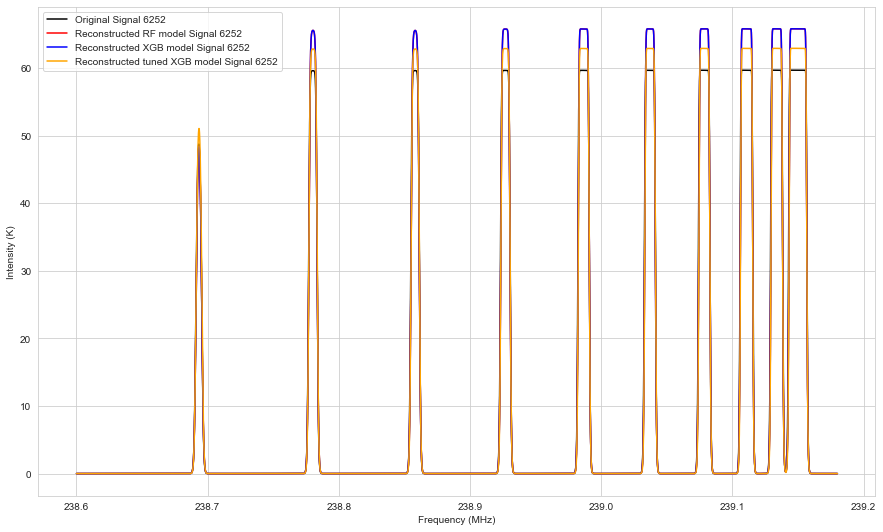

In [13]:
spectral_index = 0
reconstructed_plots(spectral_index, signal_index)

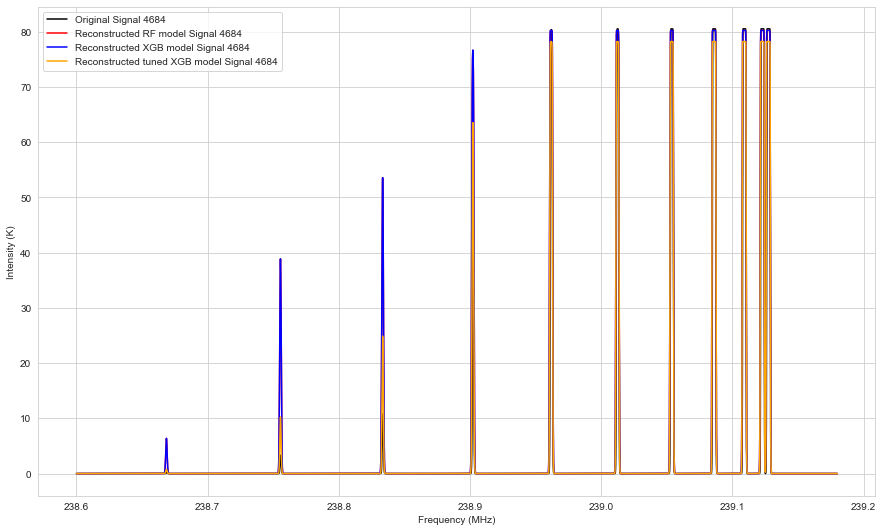

In [14]:
spectral_index = 1
reconstructed_plots(spectral_index, signal_index)

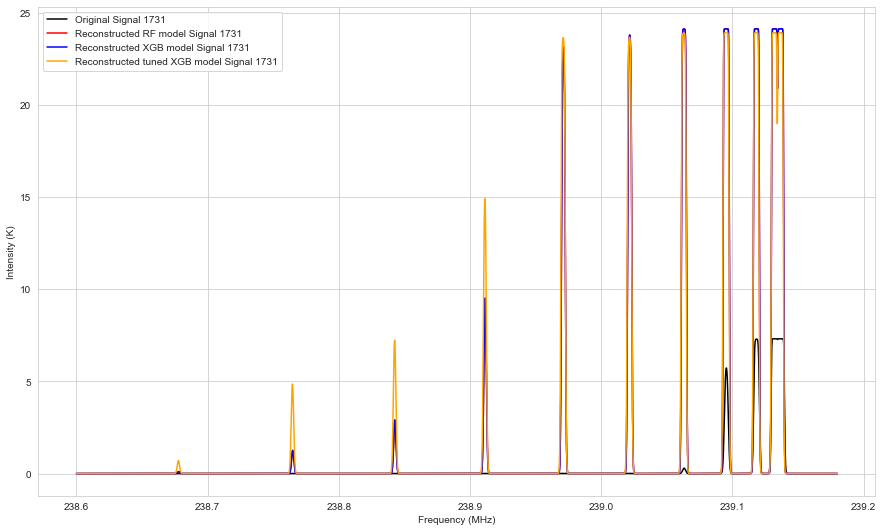

In [15]:
spectral_index = 2
reconstructed_plots(spectral_index, signal_index)

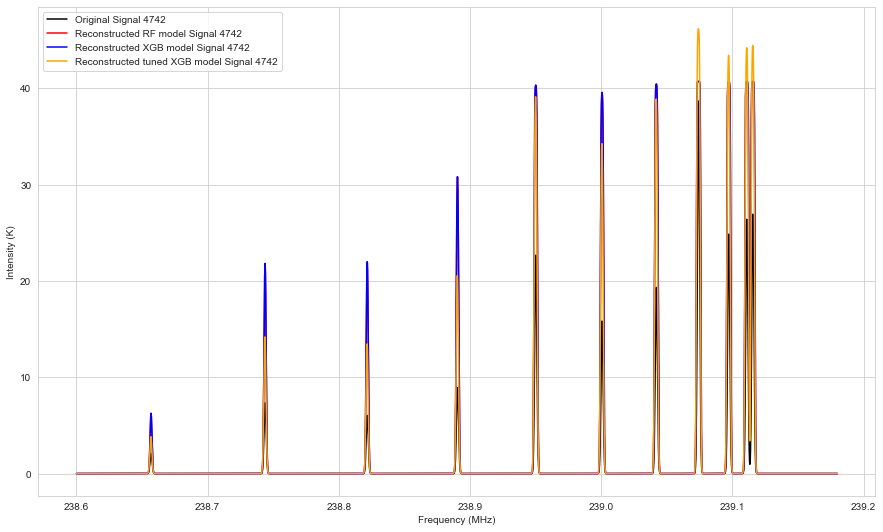

In [16]:
spectral_index = 3
reconstructed_plots(spectral_index, signal_index)

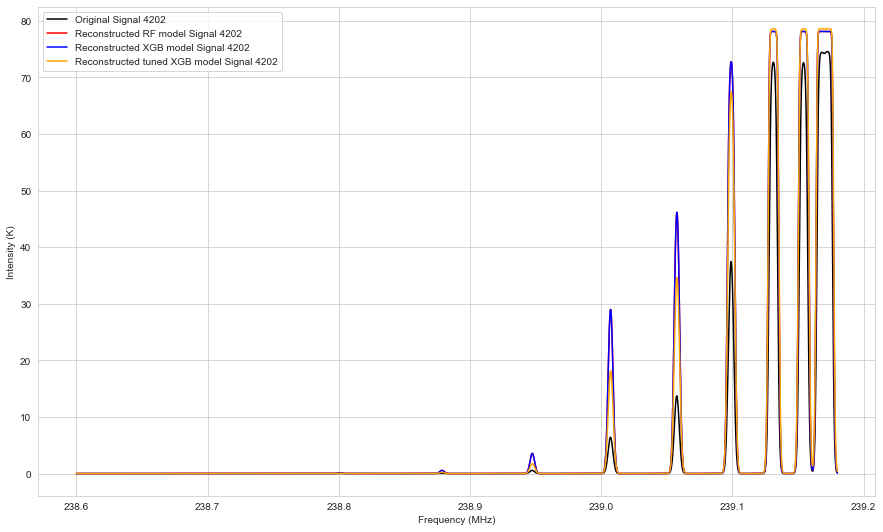

In [17]:
spectral_index = 161
reconstructed_plots(spectral_index, signal_index)

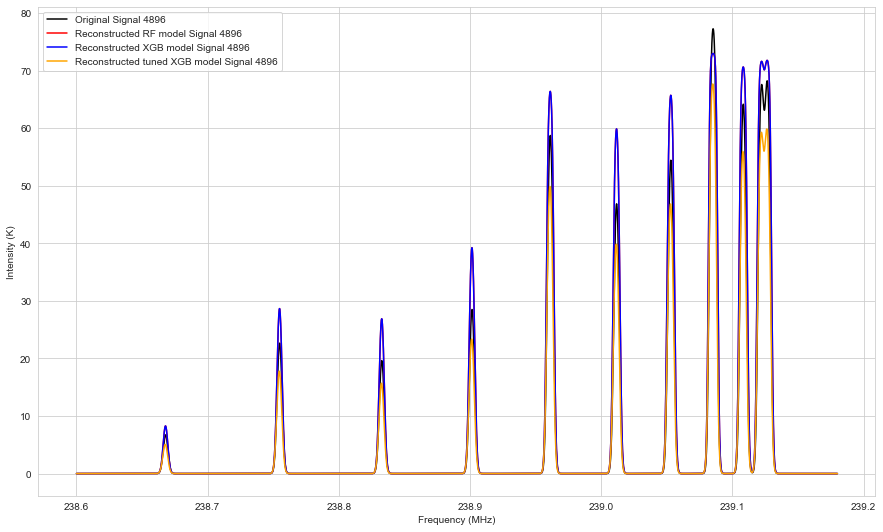

In [18]:
spectral_index = 1000
reconstructed_plots(spectral_index, signal_index)

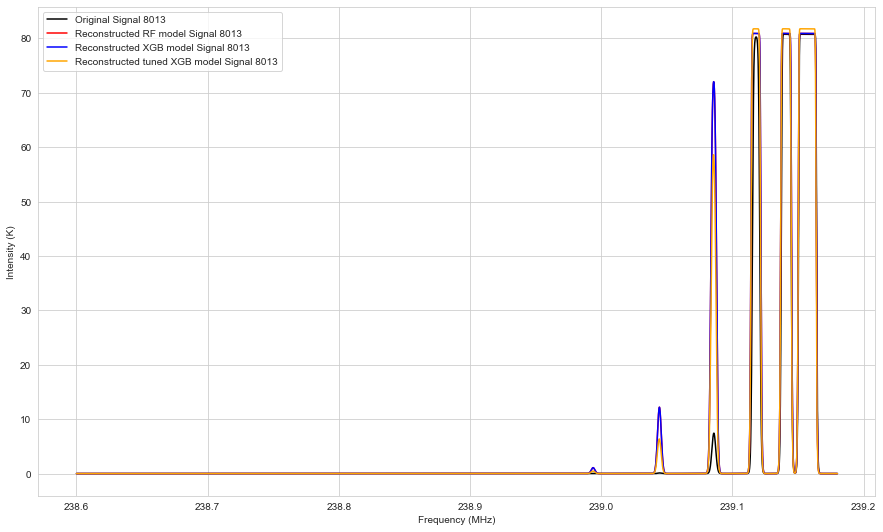

In [19]:
spectral_index = 1237
reconstructed_plots(spectral_index, signal_index)

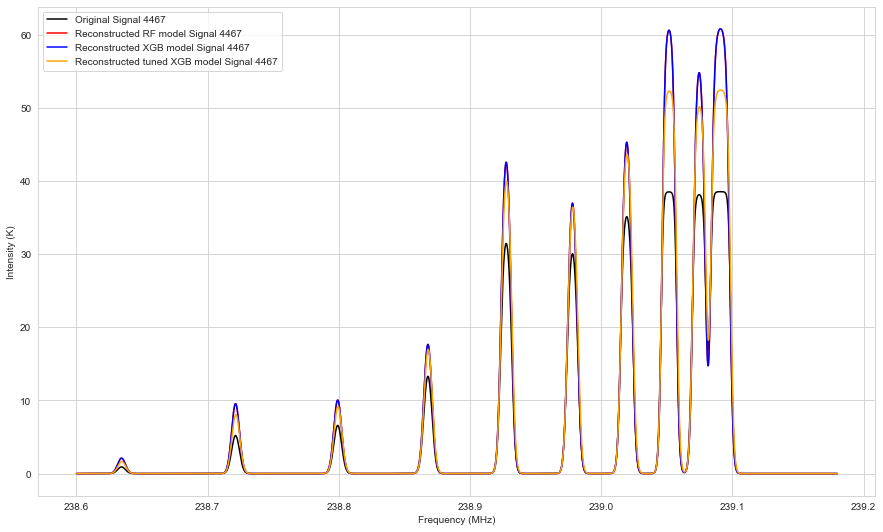

In [20]:
spectral_index = 1260
reconstructed_plots(spectral_index, signal_index)

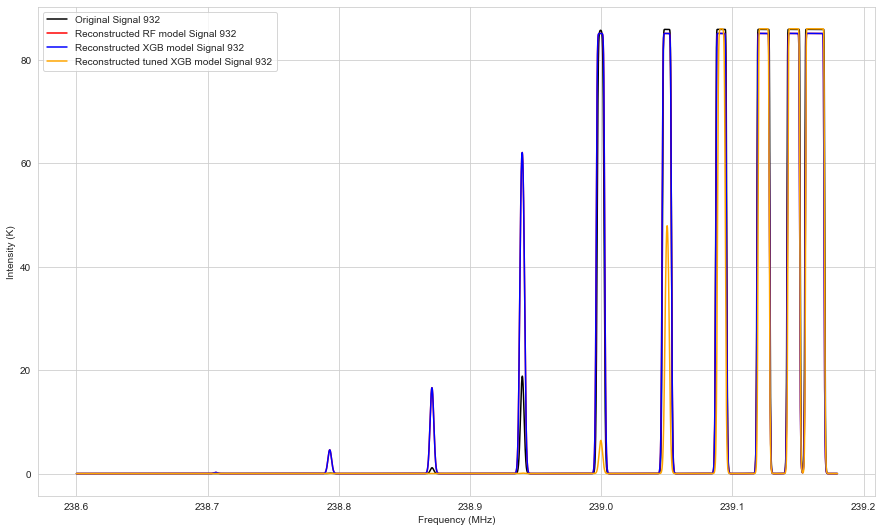

In [21]:
spectral_index = 856
reconstructed_plots(spectral_index, signal_index)

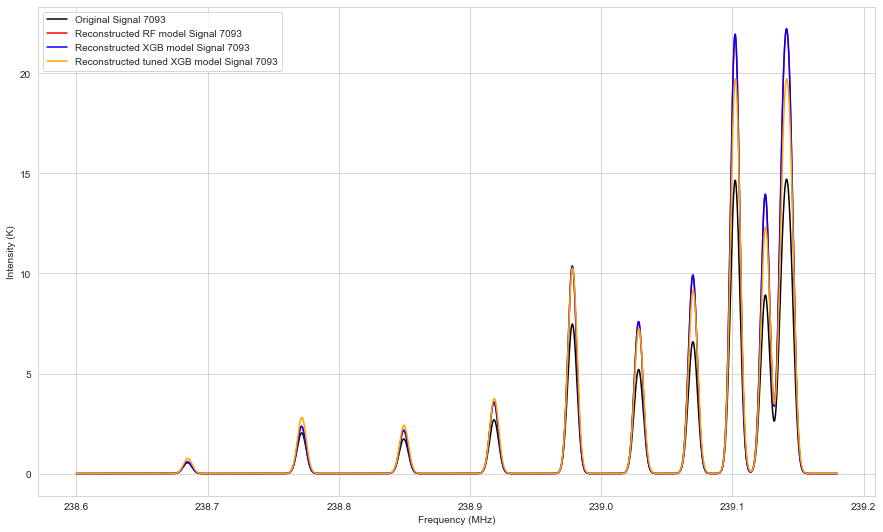

In [22]:
spectral_index = 300
reconstructed_plots(spectral_index, signal_index)

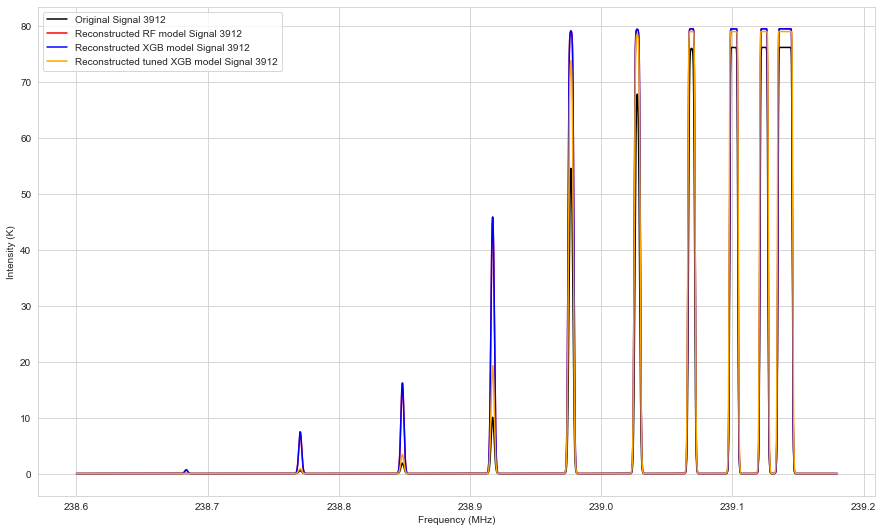

In [23]:
spectral_index = 199
reconstructed_plots(spectral_index, signal_index)

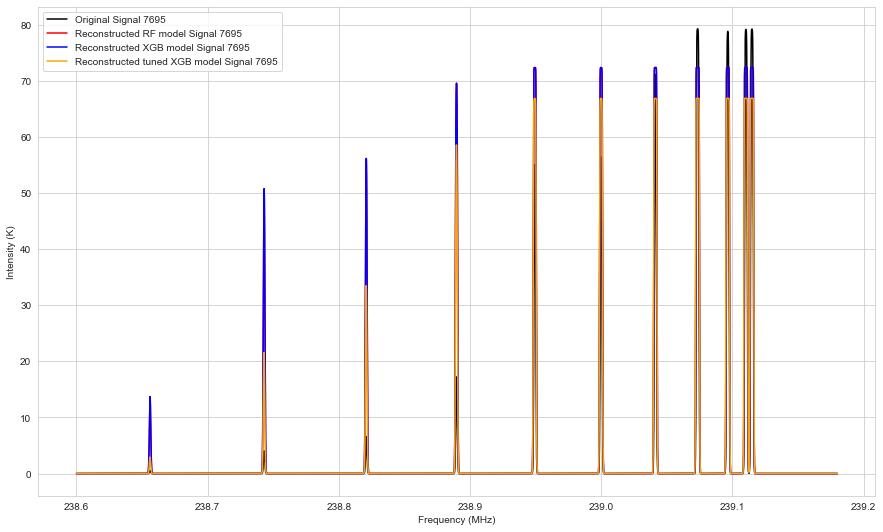

In [24]:
spectral_index = 299
reconstructed_plots(spectral_index, signal_index)

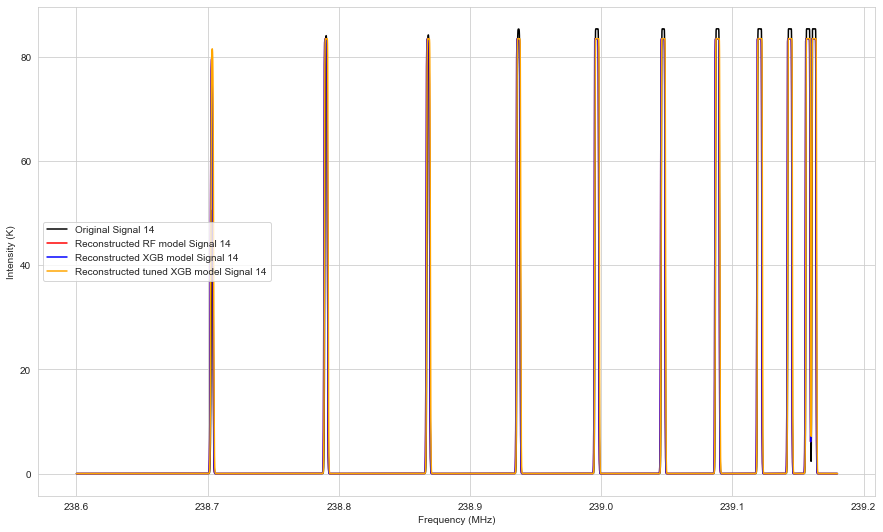

In [25]:
spectral_index = 399
reconstructed_plots(spectral_index, signal_index)

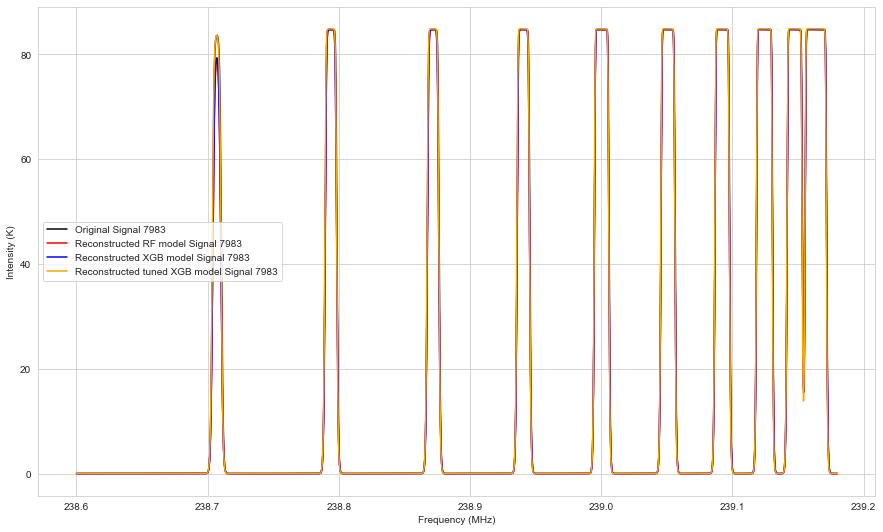

In [26]:
spectral_index = 1267
reconstructed_plots(spectral_index, signal_index)

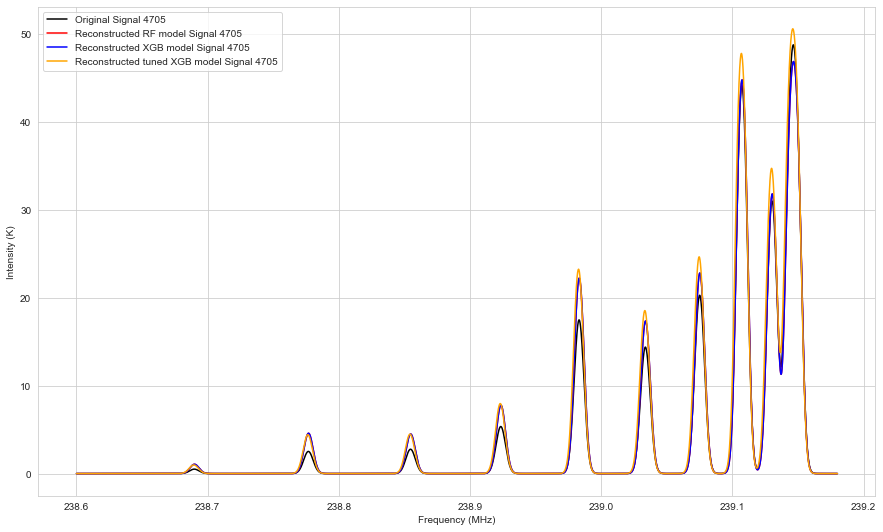

In [27]:
spectral_index = 2999
reconstructed_plots(spectral_index, signal_index)


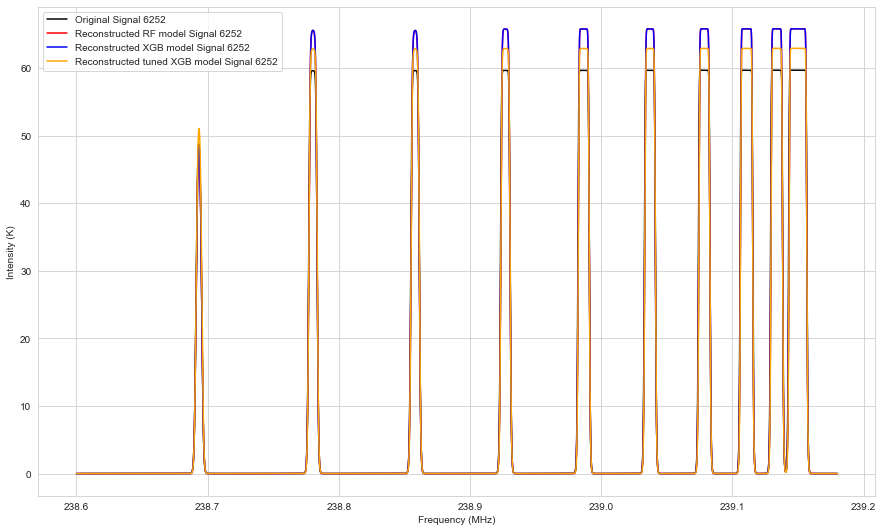

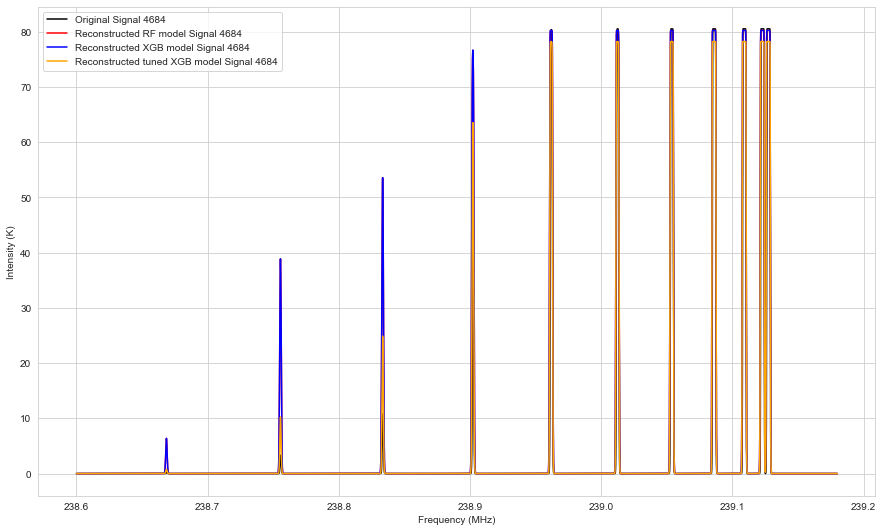

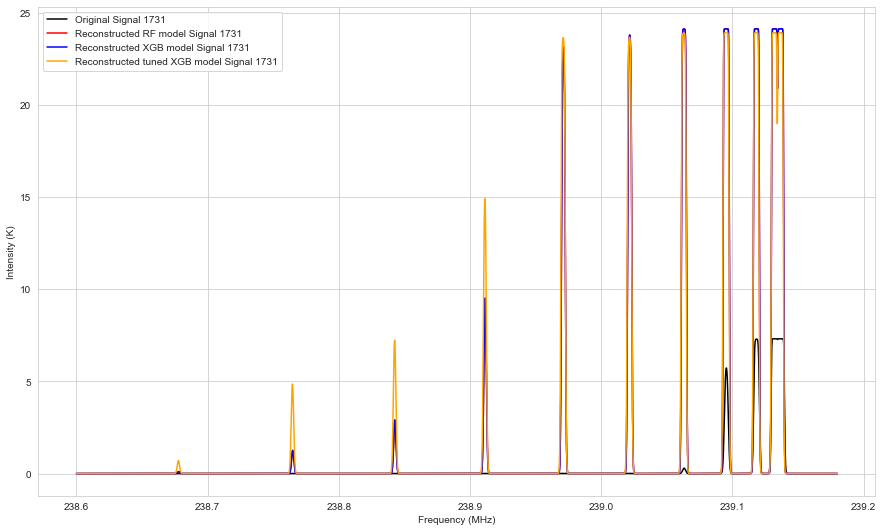

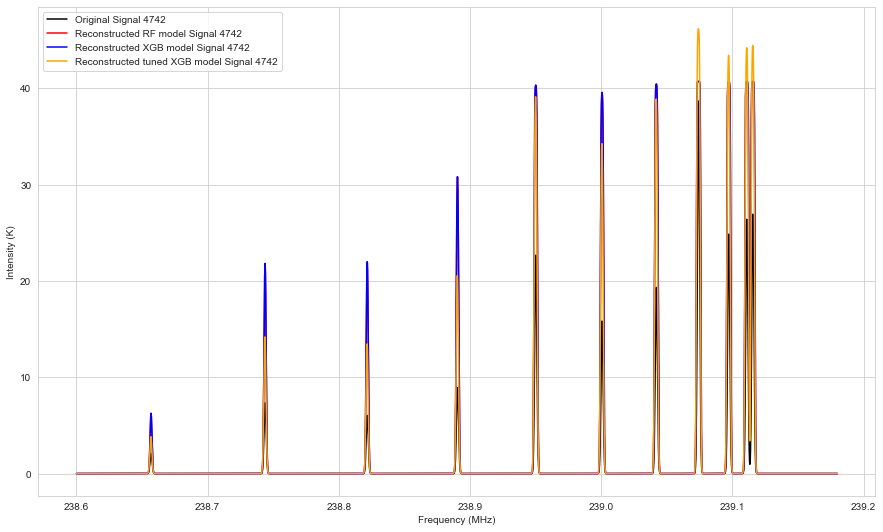

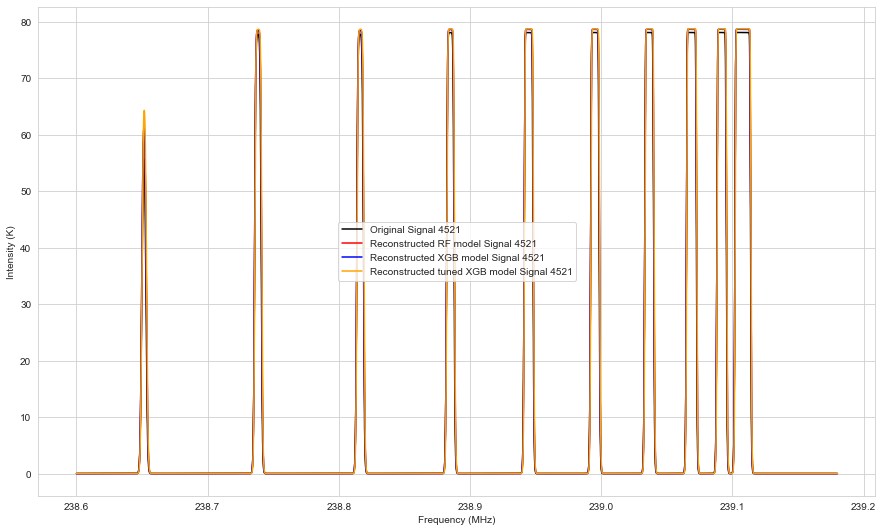

...

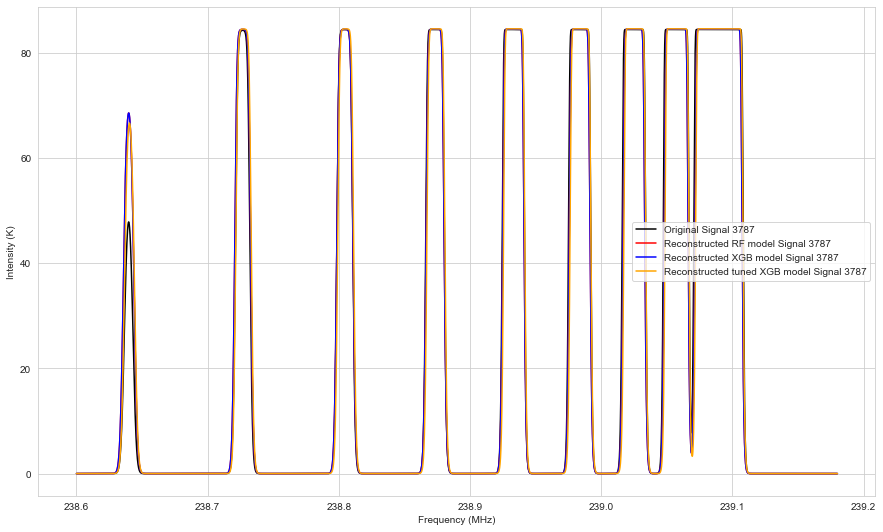

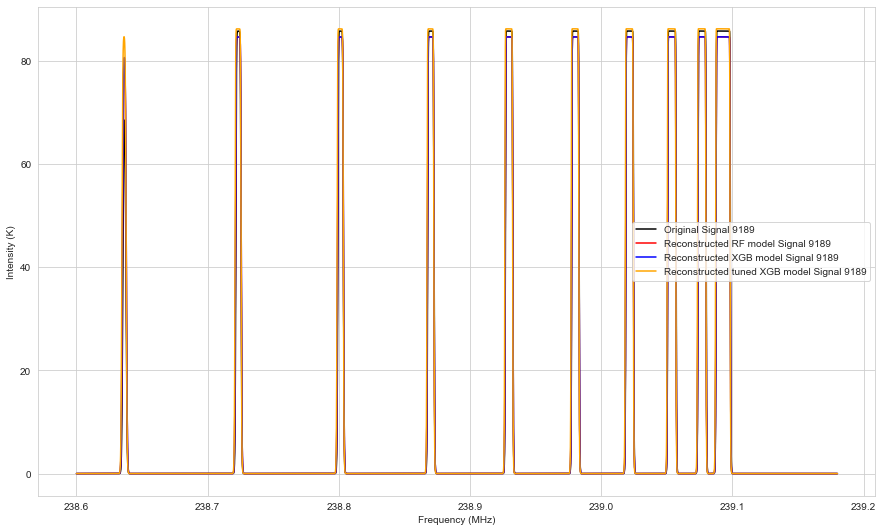

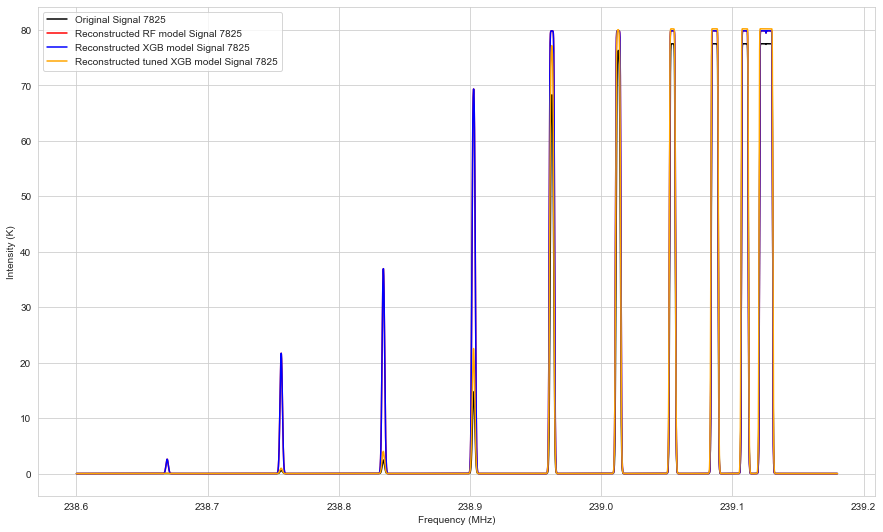

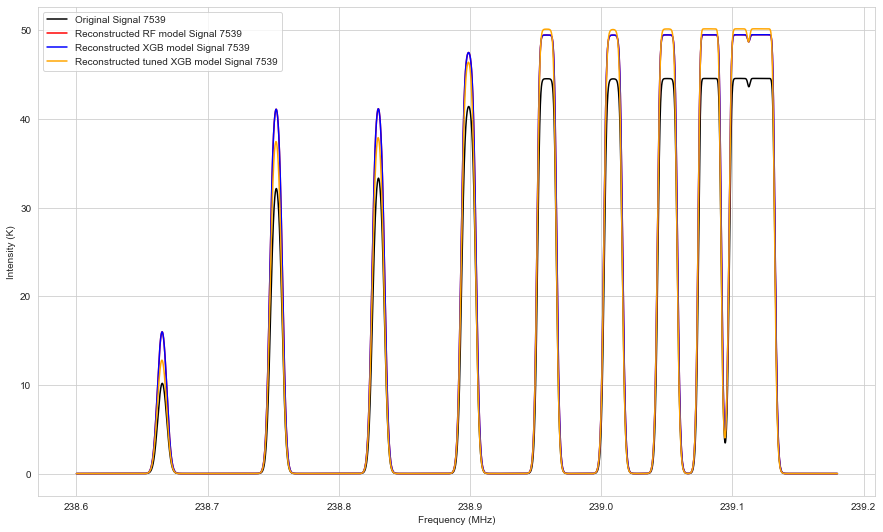

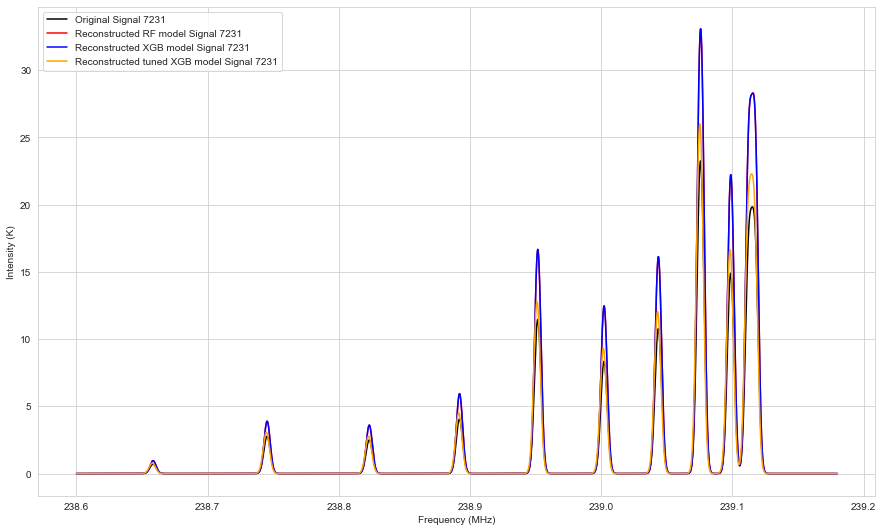

In [28]:
for spectral_index in range(100):
    reconstructed_plots(spectral_index, signal_index)